# TableNet - E2E Deep Learning Model for Table Detection & Data extraction

## 1. Description

TableNet is an end to end deep learning model which is capable of detecting the table from any image and then extract the tabular information from the table. 

## 2. Business Problem

## 2.1 Overview

The uses of mobile phone and others digital devices are increasing day by
day. With the advent of new technologies we are moving towards the digital
era. And instead of handing over the physical documents we always prefer
the scanned copy.

For e.g. To take an admission in any institution instead of entering all the
required deatils manually what if we simply provide the scanned copy of the
marksheets and certificates or while applying for a credit card/loan if the
scanned copy of payslip is provided for a salaried person, In either of the
cases system should able to extract the required information from the
images and further process them as the required details are mainly
provided in a tabular format. Not only that , even if we want to store the
informations to maintain a dataset for the future purposes,that will also be
helpful as data will be captured directly from the images so percentage of
anamoly/outliers will be very less. So If we can develop this self sufficient
system which is useful to extract the tabular informations from an image, the
amount of manual intervention can significantly be reduced.

To solve this problem first we need the accurate detection of the tabular
region within the image and then extracting the information from the rows
and columns. The initial approahes were to use two different models to
perform the entire tasks - one is for table detection and another on e is for
data extraction.

TableNet, is a single deep learning model which is capable to perform the
both tasks with high accuracy. The proposed model and extraction
approach was evaluated on the publicly available ICDAR 2013 and Marmot
Table datasets.

## 2.2. Problem Statement

1. First detect if there is any table present in the given image. It needn't be with borderline , it could be anything where rows columns like structure present
2. If table is present, extract the tabular information (in row - column format) and stored in a file

## 2.3. Dataset Source:

1. publicly available marmot dataset 
https://drive.google.com/drive/folders/1QZiv5RKe3xlOBdTzuTVuYRxixemVIODp

2. ICDAR 2017 table dataset
https://github.com/mawanda-jun/TableTrainNet/tree/master/dataset

## 2.4. Useful links

https://www.researchgate.net/publication/337242893_TableNet_Deep_Learning_Model_for_End-to-end_Table_Detection_and_Tabular_Data_Extraction_from_Scanned_Document_Images

## 2.5. Business Constraints

1. Accuracy has to be pretty high , otherwise we might end up with Information loss
2. Even though there is no strict low latency requirement , still it shouldn't be high
3. Model Interpretability is not required in this case

## 3. Data

## 3.1. Data Overview

We have total two kind of files-
first, Scanned image is provided where table like structure can be found
second, table annotations in terms of xml files ie table and column coordinates are mentioned for the corresponding image

## 4. ML/DL Problem  

## 4.1. Type

We can consider it as classifiction problem , whether the model is capable of predicting the table accurately or not

## 4.2. Performance Metric

Precision, Recall and F1-Score should be considered to check the performance of the model

## 5. Exploratory Data Analysis

In [106]:
import numpy as np 
import pandas as pd
import xml.etree.ElementTree as ET
from PIL import Image

We have total two datasets, one is Marmot Dataset and another one is ICDAR 2017 POD Competition dataset. We will check what exactly the dataset contain. The Marmot dataset is under marmot & ICDAR dataset is under tabledata directory

In general , we have the image in bmp format and corresponding annotation in xml format

In [116]:
!ls -l ../input/tabledata/Images/* | wc -l

1600


In [117]:
!ls -l ../input/tabledata/Annotations/* | wc -l

1600


In [118]:
!ls -l ../input/marmot/*.bmp | wc -l

509


In [119]:
!ls -l ../input/marmot/*.xml | wc -l

495


So the ICDAR Table dataset consists of 1600 files of each bmp and corresponding xml. However, in case of Marmot we found mismatches.

In case of Marmot , even though we have total 509 images however , there are only total corresponding annotations xml files present.

Now we will randomly load a file from each dataset , and check how does it look like

Populating the interactive namespace from numpy and matplotlib


/opt/conda/lib/python3.7/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['table']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


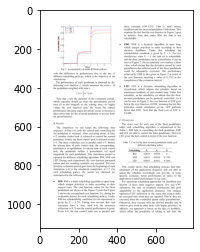

In [107]:
%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img = mpimg.imread('../input/marmot/10.1.1.1.2006_3.bmp')
imgplot = plt.imshow(img)
plt.show()

In [108]:
img = Image.open('../input/marmot/10.1.1.1.2006_3.bmp')
img.size

(793, 1123)

We have loaded 10.1.1.1.2006_3.bmp from the Marmot dataset and found the resolution is 793*1123. let's check for corresponding 
annotation (xml) file as well

In [109]:
import xml.dom.minidom
with open('../input/marmot/10.1.1.1.2006_3.xml') as xmldata:
    xml = xml.dom.minidom.parseString(xmldata.read())  # or xml.dom.minidom.parseString(xml_string)
    xml_pretty_str = xml.toprettyxml()
print (xml_pretty_str)

<?xml version="1.0" ?>
<annotation verified="yes">
	
	
	<folder>MARMOT_ANNOTATION</folder>
	
	
	<filename>10.1.1.1.2006_3.bmp</filename>
	
	
	<path>/home/monika/Desktop/MARMOT_ANNOTATION/10.1.1.1.2006_3.bmp</path>
	
	
	<source>
		
		
		<database>Unknown</database>
		
	
	</source>
	
	
	<size>
		
		
		<width>793</width>
		
		
		<height>1123</height>
		
		
		<depth>3</depth>
		
	
	</size>
	
	
	<segmented>0</segmented>
	
	
	<object>
		
		
		<name>column</name>
		
		
		<pose>Unspecified</pose>
		
		
		<truncated>0</truncated>
		
		
		<difficult>0</difficult>
		
		
		<bndbox>
			
			
			<xmin>458</xmin>
			
			
			<ymin>710</ymin>
			
			
			<xmax>517</xmax>
			
			
			<ymax>785</ymax>
			
		
		</bndbox>
		
	
	</object>
	
	
	<object>
		
		
		<name>column</name>
		
		
		<pose>Unspecified</pose>
		
		
		<truncated>0</truncated>
		
		
		<difficult>0</difficult>
		
		
		<bndbox>
			
			
			<xmin>531</xmin>
			
			
			<ymin>710</ymin>
			
			
			<xmax>568</xmax>
			
			
			<ymax>783</ymax>
			
		

So there are various tags like width, height bndbox. As per the dataset description width*height denotes the resolution of the images and <bndbox> tells us about the column coordinates in xmin,ymin,xmax,ymax format.
    
In order to retrieve the information for the image , we should parse each xml files and extract the required informations.

Now we will check , manually if we can crop the exact table present in the image based on the bndbox

Populating the interactive namespace from numpy and matplotlib


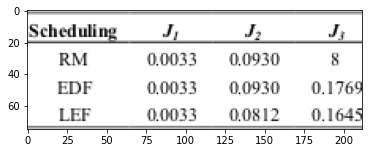

In [110]:
%pylab inline
img=Image.open('../input/marmot/10.1.1.1.2006_3.bmp')

#plt.show()
#the information are extracted manually from the xml file under <bndbox></bndbox>
xmin=min(458,531,583,637)
ymin=min(710,710,712,712)
xmax=max(517,568,619,670)
ymax=max(785,783,785,784)
crop_rectangle = (int(xmin),int(ymin),int(xmax),int(ymax))
cropped_im = img.crop(crop_rectangle)
imgplot = plt.imshow(cropped_im)

So we can conclude, the locations are correcly mentioned as we were able to extract only the table part from the image

The images could be different resolutions and as per the paper before feeding to the model we should resize them in 1024*1024 formt. In the next step We will check how the coordinates will be varied if we resize them 

In [120]:
im = Image.open('../input/marmot/10.1.1.1.2006_3.bmp')
img=im.resize((1024,1024),Image.ANTIALIAS)
img.size

(1024, 1024)

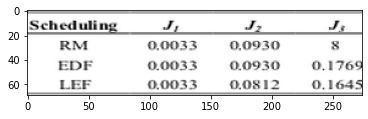

In [121]:
targetsize=1024
x_=targetsize/(im.size[0])
y_=targetsize/(im.size[1])

xmin=min(458,531,583,637)
ymin=min(710,710,712,712)
xmax=max(517,568,619,670)
ymax=max(785,783,785,784)

xmin=np.round(xmin*x_)
xmax=np.round(xmax*x_)
ymin=np.round(ymin*y_)
ymax=np.round(ymax*y_)

crop_rectangle = (int(xmin),int(ymin),int(xmax),int(ymax))

cropped_im = img.crop(crop_rectangle)
imgplot = plt.imshow(cropped_im)

So after adjusting the coordinates - xmin,xmzx,ymin, ymax we can extract the table as shown above

Now we will check for the another dataset from ICDAR-2017

Populating the interactive namespace from numpy and matplotlib


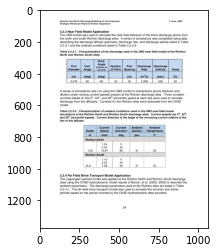

In [112]:
%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img = mpimg.imread('../input/tabledata/Images/POD_0003.bmp')
imgplot = plt.imshow(img)
plt.show()

In [115]:
img=Image.open('../input/tabledata/Images/POD_0003.bmp')
img.size

(1061, 1373)

as we checked the image size is 1061*1373 ,let's check for the corresponding annotations file

In [111]:
import xml.dom.minidom
with open('../input/tabledata/Annotations/POD_0003.xml') as xmldata:
    xml = xml.dom.minidom.parseString(xmldata.read())  # or xml.dom.minidom.parseString(xml_string)
    xml_pretty_str = xml.toprettyxml()
print (xml_pretty_str)

<?xml version="1.0" ?>
<document filename="POD_0003.xml">
	
	
	<tableRegion>
		
		
		<Coords points="167,308 893,308 167,461 893,461"/>
		
	
	</tableRegion>
	
	
	<tableRegion>
		
		
		<Coords points="274,722 786,722 274,992 786,992"/>
		
	
	</tableRegion>
	

</document>



If we compare it is clear , here only the table coordinates are given under the tag <tableRegion>. As per the dataset descriptions the points are in  [[xmin, ymin], [xmax, ymin], [xmin, ymax], [xmax, ymax]] format. 

However, no separate information is given w.r.t. the individual columns unlike Marmot dataset. Only the Table information is given.

let's check if we can crop the table from the image

Populating the interactive namespace from numpy and matplotlib


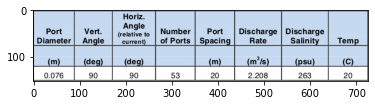

In [113]:
%pylab inline
img=Image.open('../input/tabledata/Images/POD_0003.bmp')
#img = mpimg.imread('../input/tabledata/Images/POD_0003.bmp')

plt.show()
xmin=167
ymin=308
xmax=893
ymax=461
crop_rectangle = (int(xmin),int(ymin),int(xmax),int(ymax))
cropped_im = img.crop(crop_rectangle)
imgplot = plt.imshow(cropped_im)
#cropped_im.show()

Populating the interactive namespace from numpy and matplotlib


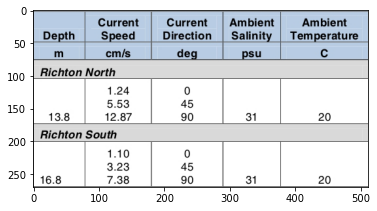

In [114]:
%pylab inline
img=Image.open('../input/tabledata/Images/POD_0003.bmp')

plt.show()
xmin=274
ymin=722
xmax=786
ymax=992
crop_rectangle = (int(xmin),int(ymin),int(xmax),int(ymax))
cropped_im = img.crop(crop_rectangle)
imgplot = plt.imshow(cropped_im)
#cropped_im.show()

The tables are extracted as it is as per the information given

Now we will check after converting the image resolution in 1024*1024

In [124]:
im = Image.open('../input/tabledata/Images/POD_0003.bmp')
img=im.resize((1024,1024),Image.ANTIALIAS)
img.size

(1024, 1024)

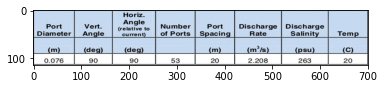

In [125]:
targetsize=1024
x_=targetsize/(im.size[0])
y_=targetsize/(im.size[1])

xmin=167
ymin=308
xmax=893
ymax=461

xmin=np.round(xmin*x_)
xmax=np.round(xmax*x_)
ymin=np.round(ymin*y_)
ymax=np.round(ymax*y_)

crop_rectangle = (int(xmin),int(ymin),int(xmax),int(ymax))

cropped_im = img.crop(crop_rectangle)
imgplot = plt.imshow(cropped_im)

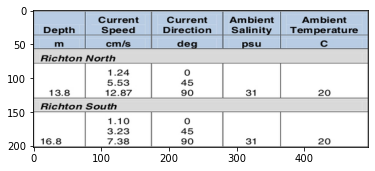

In [126]:
targetsize=1024
x_=targetsize/(im.size[0])
y_=targetsize/(im.size[1])

xmin=274
ymin=722
xmax=786
ymax=992

xmin=np.round(xmin*x_)
xmax=np.round(xmax*x_)
ymin=np.round(ymin*y_)
ymax=np.round(ymax*y_)

crop_rectangle = (int(xmin),int(ymin),int(xmax),int(ymax))

cropped_im = img.crop(crop_rectangle)
imgplot = plt.imshow(cropped_im)

So far we have analyzed one random entry from each dataset , as next step we will extract all the required information and converting the image resolution to 1024*1024 format

In [ ]:
!mkdir marmot_1024

In [ ]:
"""
the function will be useful for resizing the image in 1024*1024 format
"""
def resolution_1024(file):
    img=file.resize((1024,1024),Image.ANTIALIAS)
    return img
    

In [ ]:
#for Marmot data
import os
count=0
for dirname, _, filenames in os.walk('../input/marmot/'):
    for filename in filenames:
        if filename.endswith('.bmp'):
            count=count+1
            path='../input/marmot/'+filename
            img=Image.open(path)
            #print(type(img))
            img=resolution_1024(img)
            img.save('./marmot_1024/'+filename+'.jpeg')

In [ ]:
!mkdir table_1024

In [ ]:
#for ICDAR tabledata
import os
count=0
for dirname, _, filenames in os.walk('../input/tabledata/Images'):
    for filename in filenames:
        if filename.endswith('.bmp'):
            count=count+1
            path='../input/tabledata/Images/'+filename
            img=Image.open(path)
            #print(type(img))
            img=resolution_1024(img)
            img.save('./table_1024/'+filename+'.jpeg')

In [ ]:
!tar -cvf table_1024.tar ./table_1024
!tar -cvf marmot_1024.tar ./marmot_1024

In [ ]:
# here we are reading the each xml files and storing the useful informations in a dataframe such as filename, width,height,
#xmin,ymin,xmax,ymax

#ref: https://www.geeksforgeeks.org/xml-parsing-python/


"""
We are extracting the required information from Marmot dataset such as width,height,xmin,ymin,xmax,ymax from the table annotation 
(xml) files and corresponding adjusted value after resizing the image in 1024*1024 format and then storing the value
in two different dataframes
"""

check=0
import os
df = pd.DataFrame()
df_1024=pd.DataFrame()
targetsize=1024
for dirname, _, filenames in os.walk('../input/marmot/'):
    for filename in filenames:
        if filename.endswith('.xml'):
            filename=os.path.join(dirname, filename)
            tree = ET.parse(filename)
            root = tree.getroot()
            name=root.find("./filename").text
            width=root.find("./size/width").text
            height=root.find("./size/height").text
            depth=root.find("./size/depth").text
            xmin=[]
            ymin=[]
            xmax=[]
            ymax=[]
            
            xmin_1024=[]
            ymin_1024=[]
            xmax_1024=[]
            ymax_1024=[]
            x_=float(targetsize/int(width))
            y_=targetsize/int(height)

            
            for bnd in root.findall("./object/bndbox/xmin"):
                xmin.append(bnd.text)
    
            for bnd in root.findall("./object/bndbox/ymin"):
                ymin.append(bnd.text)
    
            for bnd in root.findall("./object/bndbox/xmax"):
                xmax.append(bnd.text)
    
            for bnd in root.findall("./object/bndbox/ymax"):
                ymax.append(bnd.text)
            
            filename=[]
            table_width=[]
            table_height=[]
            table_depth=[]
            
            for i in range(0,len(xmax)):
                filename.append(name)
                table_width.append(width)
                table_height.append(height)
                table_depth.append(depth)
                
                scale=np.round(int(xmin[i])*x_)
                xmin_1024.append(int(scale))
                
                scale=np.round(int(xmax[i])*x_)
                xmax_1024.append(int(scale))
                
                scale=np.round(int(ymin[i])*y_)
                ymin_1024.append(int(scale))
                
                scale=np.round(int(ymax[i])*y_)
                ymax_1024.append(int(scale))
                
            Dict = dict({'filename': filename, 'table_width': table_width, 'table_height':table_height,
            'table_depth' : table_depth,'xmin':xmin,'ymin':ymin,'xmax':xmax,'ymax':ymax})
            
            Dict_1024 = dict({'filename': filename,'xmin':xmin_1024,'ymin':ymin_1024,'xmax':xmax_1024,'ymax':ymax_1024})
            
            if (check==0):
                #print("if executed")
                df=pd.DataFrame.from_dict(Dict)
                df_1024=pd.DataFrame.from_dict(Dict_1024)
                check=1
                
            elif(check!=0):
                #print("executed")
                df_new=pd.DataFrame.from_dict(Dict)
                df=df.append(df_new, ignore_index = True)  
                
                df_new=pd.DataFrame.from_dict(Dict_1024)
                df_1024=df_1024.append(df_new, ignore_index = True)

In [ ]:
df.to_csv('marmot.csv')
df_1024.to_csv('marmot_1024.csv')

In [4]:
df.head(30)

,Unnamed: 0,filename,table_width,table_height,table_depth,xmin,ymin,xmax,ymax
0,0,10.1.1.10.2226_5.bmp,816,1056,1,89,442,155,506
1,1,10.1.1.10.2226_5.bmp,816,1056,1,203,442,239,503
2,2,10.1.1.10.2226_5.bmp,816,1056,1,288,442,308,506
3,3,10.1.1.10.2226_5.bmp,816,1056,1,349,445,374,504
4,4,10.1.1.10.2226_5.bmp,816,1056,1,370,577,385,628
5,5,10.1.1.10.2226_5.bmp,816,1056,1,343,577,357,627
6,6,10.1.1.10.2226_5.bmp,816,1056,1,313,577,330,629
7,7,10.1.1.10.2226_5.bmp,816,1056,1,259,577,285,627
8,8,10.1.1.10.2226_5.bmp,816,1056,1,212,576,224,631
9,9,10.1.1.10.2226_5.bmp,816,1056,1,180,576,192,628


In [5]:
df_1024.head(30)

,Unnamed: 0,filename,xmin,ymin,xmax,ymax
0,0,10.1.1.10.2226_5.bmp,112,429,195,491
1,1,10.1.1.10.2226_5.bmp,255,429,300,488
2,2,10.1.1.10.2226_5.bmp,361,429,387,491
3,3,10.1.1.10.2226_5.bmp,438,432,469,489
4,4,10.1.1.10.2226_5.bmp,464,560,483,609
5,5,10.1.1.10.2226_5.bmp,430,560,448,608
6,6,10.1.1.10.2226_5.bmp,393,560,414,610
7,7,10.1.1.10.2226_5.bmp,325,560,358,608
8,8,10.1.1.10.2226_5.bmp,266,559,281,612
9,9,10.1.1.10.2226_5.bmp,226,559,241,609


In [ ]:
# here we are reading the each xml files and storing the useful informations in a dataframe such as filename, width,height,
#xmin,ymin,xmax,ymax

#ref: https://www.geeksforgeeks.org/xml-parsing-python/

"""
performing the same operations in ICDAR 2017 table dataset 
"""

check=0
import os
df_table = pd.DataFrame()
df_table_1024=pd.DataFrame()
targetsize=1024
for dirname, _, filenames in os.walk('../input/tabledata/Annotations/'):
    for filename in filenames:
        if filename.endswith('.xml'):
            filesname=os.path.join(dirname, filename)
            tree = ET.parse(filesname)
            root = tree.getroot()
            
            fname="../input/tabledata/Images/" + filename[:-4]+".bmp"
            img=Image.open(fname)
                
            
            if(root.findall("tableRegion")):
                
                x_=float(targetsize/int(img.size[0]))
                y_=float(targetsize/int(img.size[1]))
                
                data=root.findall("tableRegion/Coords")
                for i in range(0,len(data)):
                    point=data[i].get("points")
                    table='Y'
                    points=point.split(" ")
                    tmp=points[3]
                    #print("point3:",point[3])
                    locn=tmp.split(",")
                    xmax=locn[0]
                    ymax=locn[1]
                    
                    table_width=img.size[0]
                    table_height=img.size[1]
                    
                    name=filename[:-4]+".bmp"
                    
                
                    tmp=points[0]
                    #print()
                    locn=tmp.split(",")
                    #print(locn)
                    xmin=locn[0]
                    ymin=locn[1]
                    
                    Dict = dict({'filename': name,'table_exists':table, 'table_width': table_width, 'table_height':table_height,'xmin':xmin,'ymin':ymin,'xmax':xmax,'ymax':ymax})
                    #print(Dict)
                    
                    scale=np.round(int(xmin)*x_)
                    xmin_1024=int(scale)
                    
                    scale=np.round(int(ymin)*y_)
                    ymin_1024=int(scale)
                    
                    scale=np.round(int(xmax)*x_)
                    xmax_1024=int(scale)
                    
                    scale=np.round(int(ymax)*y_)
                    ymax_1024=int(scale)
                    
                    Dict_1024 = dict({'filename': name,'table_exists':table, 'table_width': table_width,'table_height':table_height,'xmin_1024':xmin_1024,'ymin_1024':ymin_1024,'xmax_1024':xmax_1024,'ymax_1024':ymax_1024})
                    
                    if (check==0):
                        df_table=pd.DataFrame([Dict])
                        df_table_1024=pd.DataFrame([Dict_1024])
                        check=1
                    elif(check!=0):
                        df_new=pd.DataFrame([Dict])
                        df_table=df_table.append(df_new, ignore_index = True)
                        df_new=pd.DataFrame([Dict_1024])
                        df_table_1024=df_table_1024.append(df_new, ignore_index = True)
                ymax_1024.append(int(scale))
                
            else:
                name=filename[:-4]+".bmp"
                table='N'
                xmin=0
                xmax=0
                ymin=0
                ymax=0
                table_width=img.size[0]
                table_height=img.size[1]
                Dict = dict({'filename': name,'table_exists':table, 'table_width': table_width, 'table_height':table_height,'xmin':xmin,'ymin':ymin,'xmax':xmax,'ymax':ymax})
                Dict_1024 = dict({'filename': name,'table_exists':table, 'table_width': table_width,'table_height':table_height,'xmin_1024':xmin,'ymin_1024':ymin,'xmax_1024':xmax,'ymax_1024':ymax})
                if (check==0):
                    df_table=pd.DataFrame([Dict])
                    df_table_1024=pd.DataFrame([Dict_1024])
                    check=1
                elif (check!=0):
                    df_new=pd.DataFrame([Dict])
                    df_table=df_table.append(df_new, ignore_index = True)
                    
                    df_new=pd.DataFrame([Dict_1024])
                    df_table_1024=df_table_1024.append(df_new, ignore_index = True)
                #print(Dict)

In [ ]:
df_table.to_csv('df_table_data.csv')
df_table_1024.to_csv('df_table_data_1024.csv')

In [8]:
df_table.head(20)

,Unnamed: 0,filename,table_exists,table_width,table_height,xmin,ymin,xmax,ymax
0,0,POD_1449.bmp,N,749,1123,0,0,0,0
1,1,POD_0017.bmp,Y,1031,1459,166,267,864,667
2,2,POD_0771.bmp,N,1061,1373,0,0,0,0
3,3,POD_0466.bmp,N,1031,1459,0,0,0,0
4,4,POD_0039.bmp,N,1061,1373,0,0,0,0
5,5,POD_0988.bmp,N,1032,1459,0,0,0,0
6,6,POD_0707.bmp,N,1031,1459,0,0,0,0
7,7,POD_0514.bmp,N,1061,1373,0,0,0,0
8,8,POD_0324.bmp,Y,1061,1373,194,184,865,984
9,9,POD_0724.bmp,Y,1061,1373,237,195,825,839


In [9]:
df_table_1024.head(20)

,Unnamed: 0,filename,table_exists,table_width,table_height,xmin_1024,ymin_1024,xmax_1024,ymax_1024
0,0,POD_1449.bmp,N,749,1123,0,0,0,0
1,1,POD_0017.bmp,Y,1031,1459,165,187,858,468
2,2,POD_0771.bmp,N,1061,1373,0,0,0,0
3,3,POD_0466.bmp,N,1031,1459,0,0,0,0
4,4,POD_0039.bmp,N,1061,1373,0,0,0,0
5,5,POD_0988.bmp,N,1032,1459,0,0,0,0
6,6,POD_0707.bmp,N,1031,1459,0,0,0,0
7,7,POD_0514.bmp,N,1061,1373,0,0,0,0
8,8,POD_0324.bmp,Y,1061,1373,187,137,835,734
9,9,POD_0724.bmp,Y,1061,1373,229,145,796,626


As next step we will generate the table and column masks

In [ ]:
!mkdir table_mask_table_data table_mask_table_data_1024

In [ ]:
"""
generating the table mask of original image for ICDAR Table dataset
"""

for i in df_table['filename'].unique():
    
    width=int(df_table[df_table['filename']==i]['table_width'].unique())
    height=int(df_table[df_table['filename']==i]['table_height'].unique())
    
    xmin=df_table[df_table['filename']==i]['xmin'].to_list()
    ymin=df_table[df_table['filename']==i]['ymin'].to_list()
    xmax=df_table[df_table['filename']==i]['xmax'].to_list()
    ymax=df_table[df_table['filename']==i]['ymax'].to_list()
    
    table_mask = np.zeros((height, width), dtype=np.int32)
    
    
    for j in range(0,len(xmin)):
        table_mask[int(ymin[j]):int(ymax[j]), int(xmin[j]):int(xmax[j])] = 255
    
    im_table = Image.fromarray(table_mask.astype(np.uint8),'L')
    
    im_table.save('./table_mask_table_data/' +i+"table" + ".jpeg")

In [ ]:
!tar -cvf table_mask_table_data.tar ./table_mask_table_data

In [ ]:
"""
generate the table mask for the resize 1024*1024 image of ICDAR-tabledataset
"""

for i in df_table_1024['filename'].unique():
    
    width=1024
    height=1024
    
    xmin=df_table_1024[df_table_1024['filename']==i]['xmin_1024'].to_list()
    ymin=df_table_1024[df_table_1024['filename']==i]['ymin_1024'].to_list()
    xmax=df_table_1024[df_table_1024['filename']==i]['xmax_1024'].to_list()
    ymax=df_table_1024[df_table_1024['filename']==i]['ymax_1024'].to_list()
    
    table_mask = np.zeros((height, width), dtype=np.int32)
    
    for j in range(0,len(xmin)):
        table_mask[int(ymin[j]):int(ymax[j]), int(xmin[j]):int(xmax[j])] = 255
    
    im_table = Image.fromarray(table_mask.astype(np.uint8),'L')
    im_table.save('./table_mask_table_data_1024/' +i+"table" + ".jpeg")

In [ ]:
!tar -cvf table_mask_table_data_1024.tar ./table_mask_table_data_1024

In [ ]:
"""
generate the table and column mask for the original Marmot dataset
"""

for i in df['filename'].unique():
    
    width=int(df[df['filename']==i]['table_width'].unique())
    height=int(df[df['filename']==i]['table_height'].unique())

    xmin=df[df['filename']==i]['xmin'].to_list()
    ymin=df[df['filename']==i]['ymin'].to_list()
    xmax=df[df['filename']==i]['xmax'].to_list()
    ymax=df[df['filename']==i]['ymax'].to_list()


    column_mask = np.zeros((height, width), dtype=np.int32)
    table_mask = np.zeros((height, width), dtype=np.int32)
        
    for ele in range(0,len(xmin)):
        xmin[ele]=int(xmin[ele])
        xmax[ele]=int(xmax[ele])
        ymin[ele]=int(ymin[ele])
        ymax[ele]=int(ymax[ele])
    
    table_xmin=int(min(xmin))
        #print(table_xmin)
    table_ymin=int(min(ymin))
        #print(table_ymin)
    table_xmax=int(max(xmax))
        #print(table_xmax)
    table_ymax=int(max(ymax))
        #print(table_ymax)
    
    table_mask[table_ymin:table_ymax, table_xmin:table_xmax] = 255
    
    for j in range(0,len(xmin)):
        column_mask[int(ymin[j]):int(ymax[j]), int(xmin[j]):int(xmax[j])] = 255
        
    im_col = Image.fromarray(column_mask.astype(np.uint8),'L')
    im_table = Image.fromarray(table_mask.astype(np.uint8),'L')
    im_col.save('./marmot_column/'+ i+"_col"+".jpeg")
    #!mv *.jpeg ./column_segment/
    im_table.save('./marmot_table/' +i+"_table" + ".jpeg")

In [ ]:
!tar -cvf marmot_table.tar ./marmot_table
!tar -cvf marmot_column.tar ./marmot_column

In [ ]:
"""
generate the table and column masks for resizing Marmot dataset in 1024*1024 resolution
"""

for i in df_1024['filename'].unique():
    
    width=1024
    height=1024

    xmin=df_1024[df_1024['filename']==i]['xmin'].to_list()
    ymin=df_1024[df_1024['filename']==i]['ymin'].to_list()
    xmax=df_1024[df_1024['filename']==i]['xmax'].to_list()
    ymax=df_1024[df_1024['filename']==i]['ymax'].to_list()


    column_mask = np.zeros((height, width), dtype=np.int32)
    table_mask = np.zeros((height, width), dtype=np.int32)
        
    for ele in range(0,len(xmin)):
        xmin[ele]=int(xmin[ele])
        xmax[ele]=int(xmax[ele])
        ymin[ele]=int(ymin[ele])
        ymax[ele]=int(ymax[ele])
    
    table_xmin=int(min(xmin))
        #print(table_xmin)
    table_ymin=int(min(ymin))
        #print(table_ymin)
    table_xmax=int(max(xmax))
        #print(table_xmax)
    table_ymax=int(max(ymax))
        #print(table_ymax)
    
    table_mask[table_ymin:table_ymax, table_xmin:table_xmax] = 255
    
    for j in range(0,len(xmin)):
        column_mask[int(ymin[j]):int(ymax[j]), int(xmin[j]):int(xmax[j])] = 255
        
    im_col = Image.fromarray(column_mask.astype(np.uint8),'L')
    im_table = Image.fromarray(table_mask.astype(np.uint8),'L')
    im_col.save('./marmot_column_1024/'+ i+"_col"+".jpeg")
    #!mv *.jpeg ./column_segment/
    im_table.save('./marmot_table_1024/' +i+"_table" + ".jpeg")

In [ ]:
!tar -cvf marmot_table_1024.tar ./marmot_table_1024
!tar -cvf marmot_column_1024.tar ./marmot_column_1024

Next we will randomly load one image from each category and check if our EDA was successful

Populating the interactive namespace from numpy and matplotlib


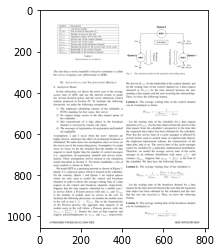

In [14]:
"""
marmot data in original format
"""
%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img = mpimg.imread('CHK1/10.1.1.1.2018_4.bmp')
imgplot = plt.imshow(img)
plt.show()

Populating the interactive namespace from numpy and matplotlib


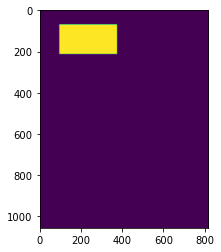

In [15]:
"""
corresponding table mask
"""

%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img = mpimg.imread('CHK1/marmot_table/10.1.1.1.2018_4.bmp_table.jpeg')
imgplot = plt.imshow(img)
plt.show()

Populating the interactive namespace from numpy and matplotlib


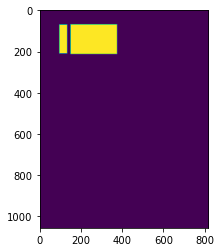

In [16]:
"""
corresponding column mask
"""

%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img = mpimg.imread('CHK1/marmot_column/10.1.1.1.2018_4.bmp_col.jpeg')
imgplot = plt.imshow(img)
plt.show()

Populating the interactive namespace from numpy and matplotlib


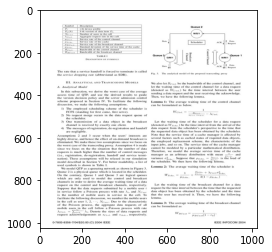

In [18]:
"""
corresponding marmot data in 1024*1024 format
"""

%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img = mpimg.imread('CHK1/marmot_1024/10.1.1.1.2018_4.bmp.jpeg')
imgplot = plt.imshow(img)
plt.show()

Populating the interactive namespace from numpy and matplotlib


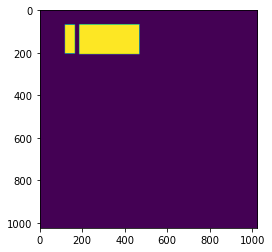

In [20]:
"""
column mask
"""

%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img = mpimg.imread('CHK1/marmot_column_1024/10.1.1.1.2018_4.bmp_col.jpeg')
imgplot = plt.imshow(img)
plt.show()

Populating the interactive namespace from numpy and matplotlib


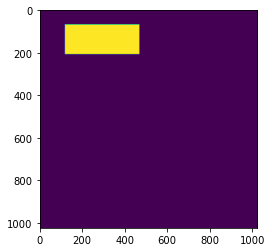

In [21]:
"""
table mask
"""

%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img = mpimg.imread('CHK1/marmot_table_1024/10.1.1.1.2018_4.bmp_table.jpeg')
imgplot = plt.imshow(img)
plt.show()

Populating the interactive namespace from numpy and matplotlib


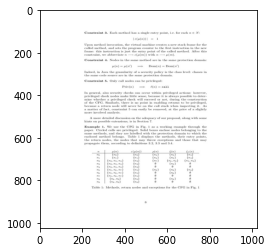

In [22]:
"""
ICDAR table data after resizing to 1024*1024
"""

%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img = mpimg.imread('CHK1/table_1024/POD_0007.bmp.jpeg')
imgplot = plt.imshow(img)
plt.show()

Populating the interactive namespace from numpy and matplotlib


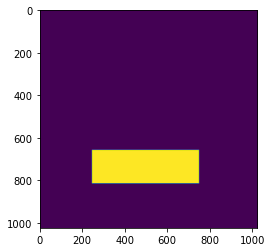

In [23]:
"""
corresponding table mask
"""

%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img = mpimg.imread('CHK1/table_mask_table_data_1024/POD_0007.bmptable.jpeg')
imgplot = plt.imshow(img)
plt.show()

Populating the interactive namespace from numpy and matplotlib


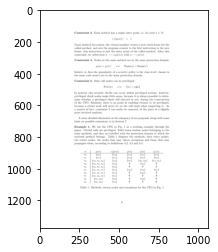

In [25]:
"""
ICDAR table data in original format
"""

%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img = mpimg.imread('CHK1/POD_0007.bmp')
imgplot = plt.imshow(img)
plt.show()

Populating the interactive namespace from numpy and matplotlib


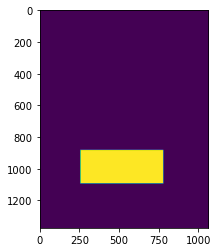

In [26]:
"""
table mask in original format
"""

%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img = mpimg.imread('CHK1/table_mask_table_data/POD_0007.bmptable.jpeg')
imgplot = plt.imshow(img)
plt.show()

## 6. Model Development

In [1]:
import tensorflow as tf
import matplotlib.pyplot as plt

from tensorflow.keras import Sequential
from tensorflow.keras.models import Model
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Lambda
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Input, Concatenate, UpSampling2D

Ref: https://stackoverflow.com/questions/58185222/read-image-and-mask-for-segmentation-problem-in-tensorflow-2-0-using-tf-data


before developing the Model architecture , we need to pre process the data. So for this we will load the Original Image and corresponding Table and column mask to create the final dataset which to be passed to the model as Input.

Since we have very limited amount of Image , so for now we will not split the data in Train-Test for validation . For now We will use the entire dataset as Train.

Ref: https://www.tensorflow.org/tutorials/images/segmentation

In [2]:
file_path='../input/data/Image/*.jpg'
image_height=1024
image_width=1024

In [3]:
def normalize(input_image):
    input_image = tf.cast(input_image, tf.float32) / 255.0
    #input_mask -= 1
    return input_image

In [4]:
def decode_image(image):
    img=tf.io.decode_jpeg(image)
    img=tf.image.resize(img, [image_height, image_width])
    return img

In [5]:
def decode_mask(image):
    img=tf.io.decode_jpeg(image,channels=1)
    img=tf.image.resize(img, [image_height, image_width])
    return img

In [6]:
def process_path(file_path):
    
    file_path=tf.strings.regex_replace(file_path,".xml", ".jpg")
    table_mask_path = tf.strings.regex_replace(file_path,"Image", "table_mask")
    column_mask_path = tf.strings.regex_replace(file_path,"Image", "column_mask")
    
    table_mask_path=tf.strings.regex_replace(table_mask_path,'.jpg','.jpeg')
    column_mask_path=tf.strings.regex_replace(column_mask_path,'.jpg','.jpeg')
    
    img = tf.io.read_file(file_path)
    
    table_mask=tf.io.read_file(table_mask_path)
    column_mask=tf.io.read_file(column_mask_path)
    

    img = decode_image(img)
    table_mask=decode_mask(table_mask)
    column_mask=decode_mask(column_mask)
    
    
    img=normalize(img)
    table_mask=normalize(table_mask)
    column_mask=normalize(column_mask)

    return img, {'table_mask':table_mask,'column_mask':column_mask}

In [7]:
file_data = tf.data.Dataset.list_files("../input/data/Image/*.xml")

DATASET_SIZE = len(list(list_ds))
TRAIN_LENGTH = int(0.9 * DATASET_SIZE)
test_size = int(0.1 * DATASET_SIZE)
BATCH_SIZE = 3
BUFFER_SIZE = 1000
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE

In [8]:
file_data = tf.data.Dataset.list_files("../input/data/Image/*.xml")
train=file_data.take(TRAIN_LENGTH)
test=file_data.skip(TRAIN_LENGTH)

In [9]:
train = train.map(process_path, num_parallel_calls=tf.data.experimental.AUTOTUNE)
test = test.map(process_path)

In [11]:
train_dataset = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
train_dataset = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
test_dataset = test.batch(BATCH_SIZE)

In [12]:
def display(display_list):
    
    plt.figure(figsize=(15, 15))

    title = ['Input Image', 'Table Mask', 'Column Mask']

    for i in range(len(display_list)):
    #print("i:",i)
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

(256, 256, 3)


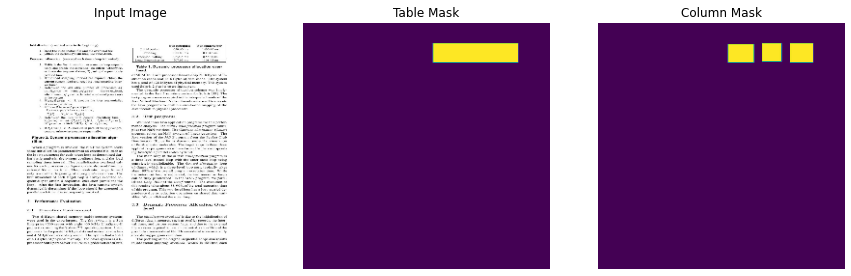

(256, 256, 3)


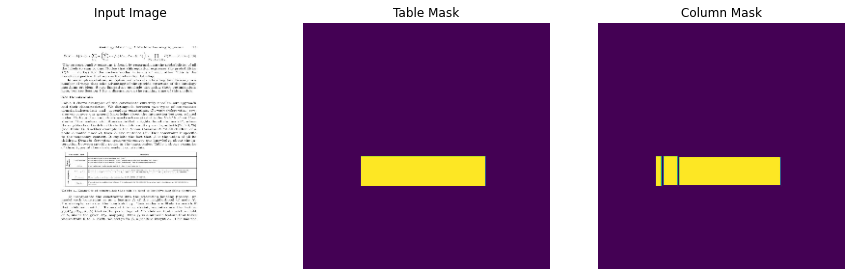

In [13]:
for image, mask  in train.take(2):
    print(image.shape)
    display([image, mask['table_mask'], mask['column_mask']])

Since we have prepared the Train-Test dataset , now as a next step we need to develop the Tablenet model architecture . Input data will be the Image and corresponding Table and column masks. Whereas o/p will be Table and Column masks generated by the model

Tensorflow documentation has been used extensively to create the mask of an image

https://www.tensorflow.org/tutorials/images/segmentation

In [14]:
def table_decoder(inputs,pool3,pool4):
    
    x = Conv2D(512, (1, 1), activation = 'relu', name='conv7_table')(inputs)
    x = UpSampling2D(size=(2, 2))(x)
    
    concat1=Concatenate()([x,pool4])
    
    x = UpSampling2D(size=(2, 2))(concat1)
    
    concat2=Concatenate()([x,pool3])
    
    x = UpSampling2D(size=(2,2),name='table_op')(concat2)
    x = UpSampling2D(size=(2,2))(x)
    
    final_layer = tf.keras.layers.Conv2DTranspose(3, 3, strides=2,padding='same', name='table_mask')
    
    x=final_layer(x)
    
    return x

In [17]:
def column_decoder(inputs,pool3,pool4):
    
    x = Conv2D(512, (1, 1), activation = 'relu', name='block7_conv1_column')(inputs)
    x = Dropout(0.8, name='block7_dropout_col')(x)
    
    x = Conv2D(512, (1, 1), activation = 'relu', name='block8_conv1_col')(x)
    x = UpSampling2D(size=(2, 2))(x)
    
    concat1=Concatenate()([x,pool4])
    x = UpSampling2D(size=(2, 2))(concat1)
    
    concat2=Concatenate()([x,pool3])
    x = UpSampling2D(size=(2,2),name='column_op')(concat2)
    
    x = UpSampling2D(size=(2,2))(x)
    
    final_layer = tf.keras.layers.Conv2DTranspose(3, 3, strides=2,padding='same', name='column_mask')
    
    x = final_layer(x)
    
    return x

In [15]:
inputShape = (1024, 1024, 3)

#inputShape = (256, 256,3)
inputs = Input(shape=inputShape, name='input')

vgg_19=tf.keras.applications.VGG19(input_tensor=inputs,include_top=False, weights='imagenet', pooling=None, classes=1000)
print(vgg_19.output_shape)

block3_pool=vgg_19.get_layer('block3_pool').output
print(block3_pool.get_shape)
block4_pool=vgg_19.get_layer('block4_pool').output
print(block4_pool.get_shape)

x = Conv2D(512, (1, 1), activation = 'relu', name='block6_conv1')(vgg_19.output)
print(x.get_shape)
x = Dropout(0.8, name='block6_dropout1')(x)
print(x.get_shape)

x = Conv2D(512, (1, 1), activation = 'relu', name='block6_conv2')(x)
print(x.get_shape)
x = Dropout(0.8, name = 'block6_dropout2')(x)
print(x.get_shape)

80142336/80134624 [==============================] - 1s 0us/step
(None, 8, 8, 512)
<bound method Tensor.get_shape of <tf.Tensor 'block3_pool/MaxPool:0' shape=(None, 32, 32, 256) dtype=float32>>
<bound method Tensor.get_shape of <tf.Tensor 'block4_pool/MaxPool:0' shape=(None, 16, 16, 512) dtype=float32>>
<bound method Tensor.get_shape of <tf.Tensor 'block6_conv1/Relu:0' shape=(None, 8, 8, 512) dtype=float32>>
<bound method Tensor.get_shape of <tf.Tensor 'block6_dropout1/cond/Identity:0' shape=(None, 8, 8, 512) dtype=float32>>
<bound method Tensor.get_shape of <tf.Tensor 'block6_conv2/Relu:0' shape=(None, 8, 8, 512) dtype=float32>>
<bound method Tensor.get_shape of <tf.Tensor 'block6_dropout2/cond/Identity:0' shape=(None, 8, 8, 512) dtype=float32>>


In [18]:
table_mask=table_decoder(x,block3_pool,block4_pool)
column_mask=column_decoder(x,block3_pool,block4_pool)

In [19]:
model = Model(inputs=inputs,outputs=[table_mask, column_mask],name="tablenet")

80142336/80134624 [==============================] - 1s 0us/step


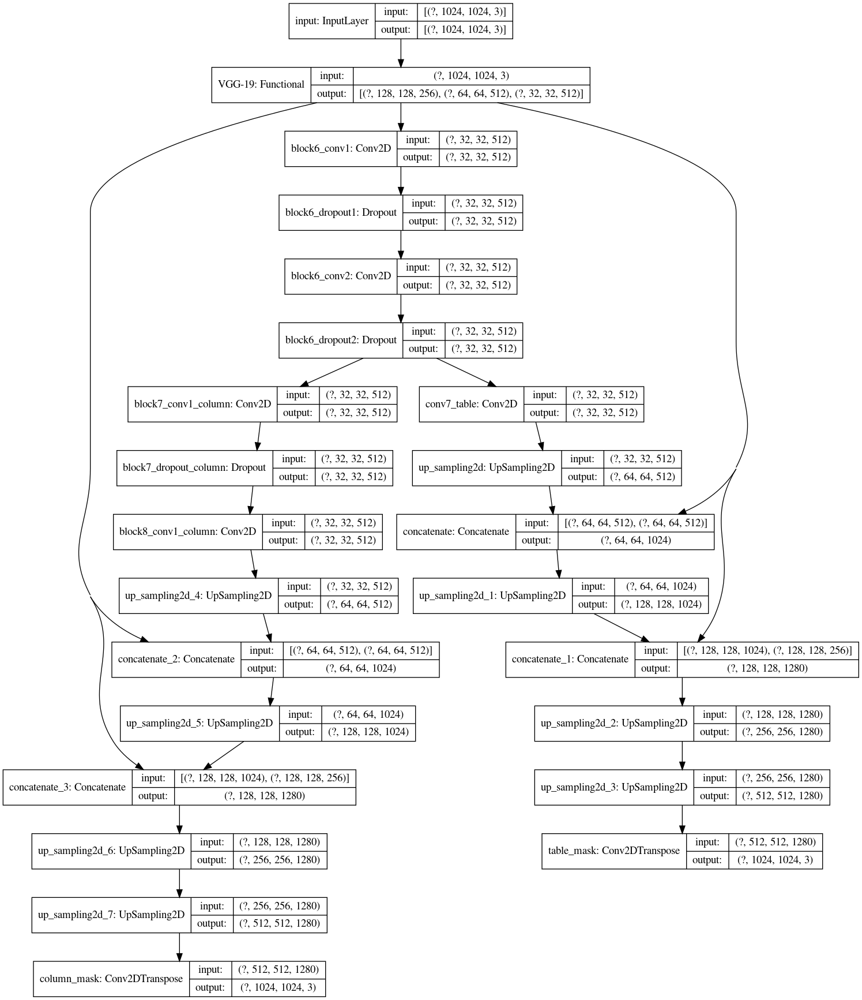

In [8]:
tf.keras.utils.plot_model(model,show_shapes=True,show_layer_names=True)

In [21]:
losses = {
    "table_mask": tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    "column_mask": tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
}

lossWeights = {"table_mask": 1.0, "column_mask": 1.0}

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001, epsilon=1e-08),
              loss=losses,
              metrics=['accuracy'],
              loss_weights=lossWeights)

In [22]:
def create_mask(pred_mask1, pred_mask2):
    pred_mask1 = tf.argmax(pred_mask1, axis=-1)
    pred_mask1 = pred_mask1[..., tf.newaxis]
    
    pred_mask2 = tf.argmax(pred_mask2, axis=-1)
    pred_mask2 = pred_mask2[..., tf.newaxis]
    return pred_mask1[0], pred_mask2[0]


In [23]:
def show_predictions(dataset=None, num=1):
    if dataset:

        for image, (mask1, mask2) in dataset.take(num):
            
            pred_mask1, pred_mask2 = model.predict(image, verbose=1)
            table_mask, column_mask = create_mask(pred_mask1, pred_mask2)
            display([image[0], table_mask, column_mask])
    else:
        pred_mask1, pred_mask2 = model.predict(sample_image, verbose=1)
        table_mask, column_mask = create_mask(pred_mask1, pred_mask2)

        display([sample_image[0], table_mask, column_mask])

In [ ]:
!ls '../input/data19/pre_data/column_mask/10.1.1.1.2010_5.jpeg'

In [24]:
from IPython.display import clear_output

class DisplayCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        clear_output(wait=True)
        show_predictions()
        print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

1/1 [==============================] - 0s 293ms/step


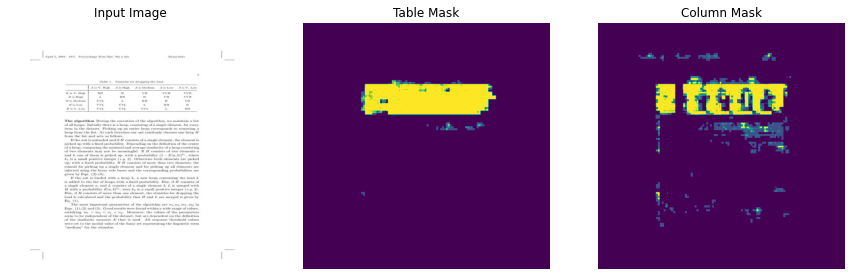


Sample Prediction after epoch 73


Epoch 00073: val_loss did not improve from 0.24500
444/444 [==============================] - 195s 438ms/step - loss: 0.2746 - table_mask_loss: 0.1348 - column_mask_loss: 0.1397 - table_mask_accuracy: 0.9396 - column_mask_accuracy: 0.9202 - val_loss: 0.4148 - val_table_mask_loss: 0.1402 - val_column_mask_loss: 0.2746 - val_table_mask_accuracy: 0.9405 - val_column_mask_accuracy: 0.8692
Epoch 74/100
117/444 [======>.......................] - ETA: 2:19 - loss: 0.2503 - table_mask_loss: 0.1258 - column_mask_loss: 0.1246 - table_mask_accuracy: 0.9429 - column_mask_accuracy: 0.9261

KeyboardInterrupt: 

In [13]:
EPOCHS = 100
VAL_SUBSPLITS = 5
VALIDATION_STEPS = test_size//BATCH_SIZE//VAL_SUBSPLITS


model_history = model.fit(train_dataset, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=test_dataset,
                          callbacks=[DisplayCallback(), model_checkpoint])

1/1 [==============================] - 0s 279ms/step


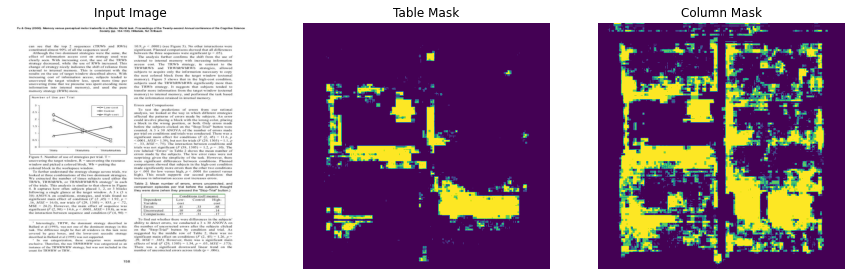

1/1 [==============================] - 0s 271ms/step


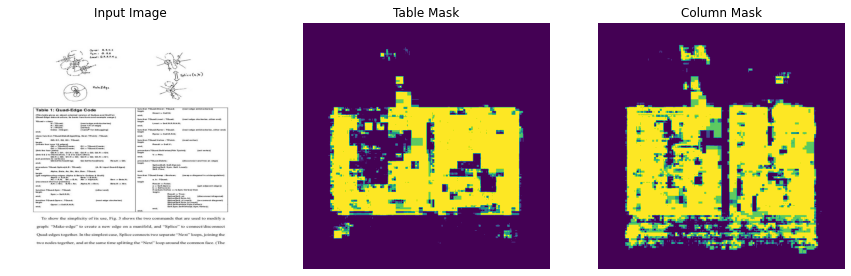

1/1 [==============================] - 0s 257ms/step


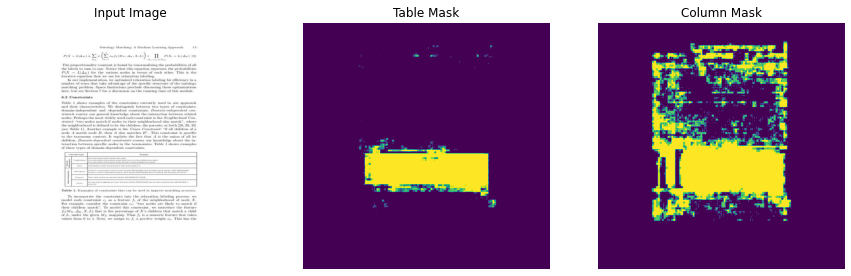

1/1 [==============================] - 0s 257ms/step


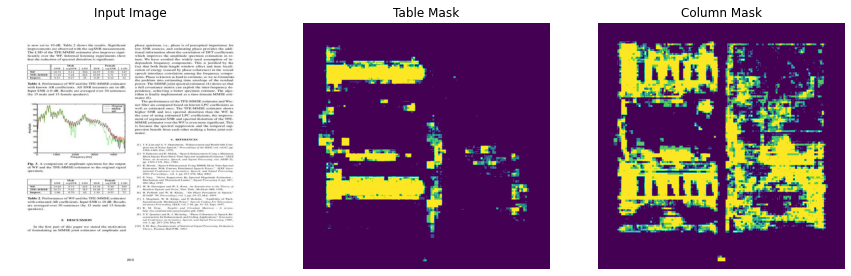

1/1 [==============================] - 0s 258ms/step


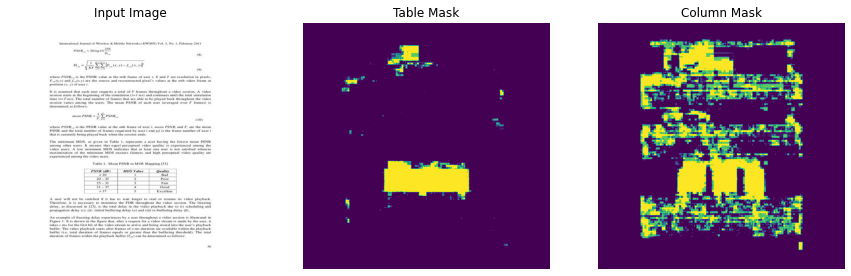

1/1 [==============================] - 0s 256ms/step


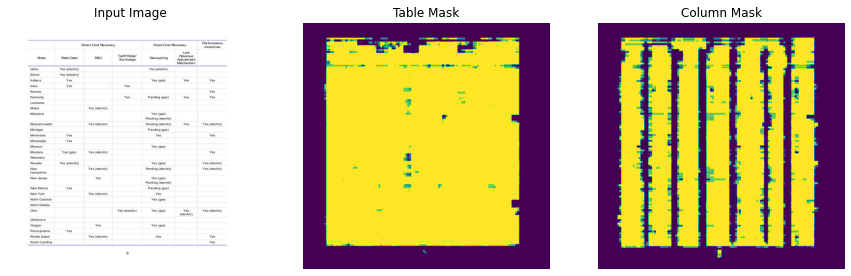

1/1 [==============================] - 0s 257ms/step


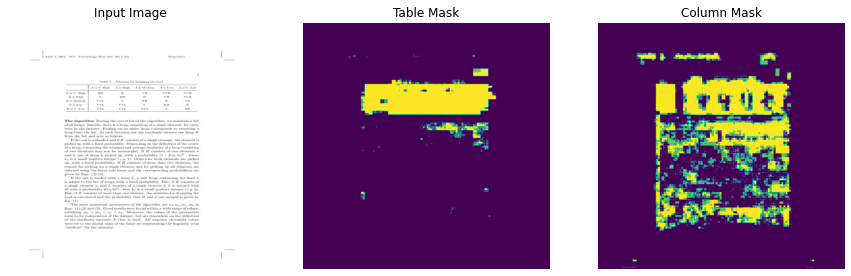

1/1 [==============================] - 0s 258ms/step


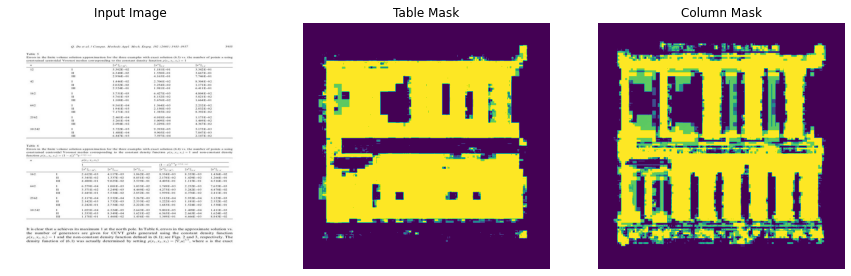

1/1 [==============================] - 0s 256ms/step


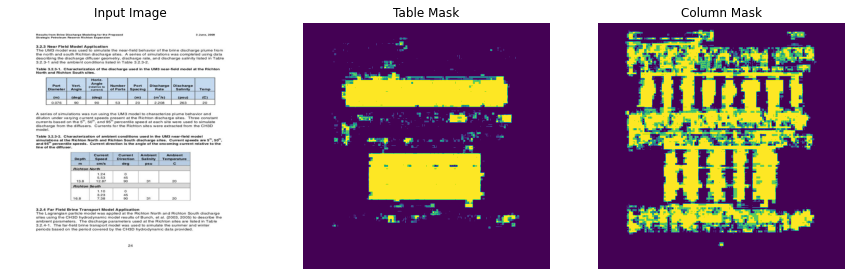

1/1 [==============================] - 0s 257ms/step


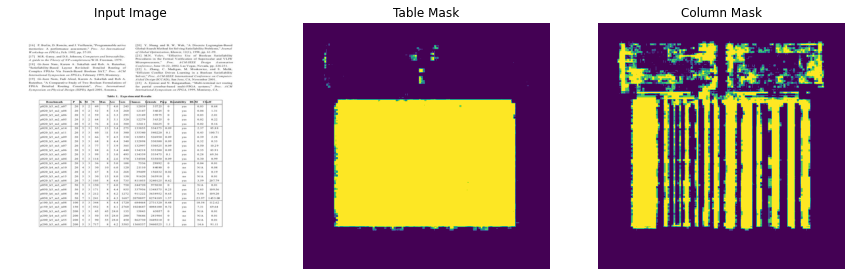

In [14]:
show_predictions(test_dataset, 10)

## 7. Model Prediction and Data Extraction

Since we were able to create the table and Column masks, as a next step we should be able to extract the informations based on the mask Image

For testing purpose we will randomly pick one data from the test dataset and see how well the model perform

In [21]:
"""
we are using the same show_prediction function which is defined earlier and modified slightly. So instead of displaying the 
image result we are going to save the Image and correspondings Table and Column masks in a .bmp format

"""

def show_prediction(dataset=None, num=1):
    
    if dataset:
        
        print("if")
        
        for image, (mask1, mask2) in dataset.take(num):
            pred_mask1, pred_mask2 = model.predict(image, verbose=1)
            table_mask, column_mask = create_mask(pred_mask1, pred_mask2)
        
        im=tf.keras.preprocessing.image.array_to_img(image[0])
        im.save('image.bmp')
        
        im=tf.keras.preprocessing.image.array_to_img(table_mask)
        im.save('table_mask.bmp')
        
        im=tf.keras.preprocessing.image.array_to_img(column_mask)
        im.save('column_mask.bmp')
      #display([image[0], table_mask, column_mask])
    else:
        
        print("else")
        
        pred_mask1, pred_mask2 = model.predict(sample_image, verbose=1)
        table_mask, column_mask = create_mask(pred_mask1, pred_mask2)
        #im=tf.keras.preprocessing.image.array_to_img(display_list[i])
        
        im=tf.keras.preprocessing.image.array_to_img(image)
        image.save('image.png')
        
        im=tf.keras.preprocessing.image.array_to_img(table_mask)
        im.save('table_mask.png')
        
        im=tf.keras.preprocessing.image.array_to_img(column_mask)
        im.save('column_mask.png')

    #display([sample_image[0], table_mask, column_mask])

In [46]:
show_prediction(test_dataset,1)

if
1/1 [==============================] - 0s 271ms/step


let's display the randomly chosen image from the test dataset and generated table and column masks

Image
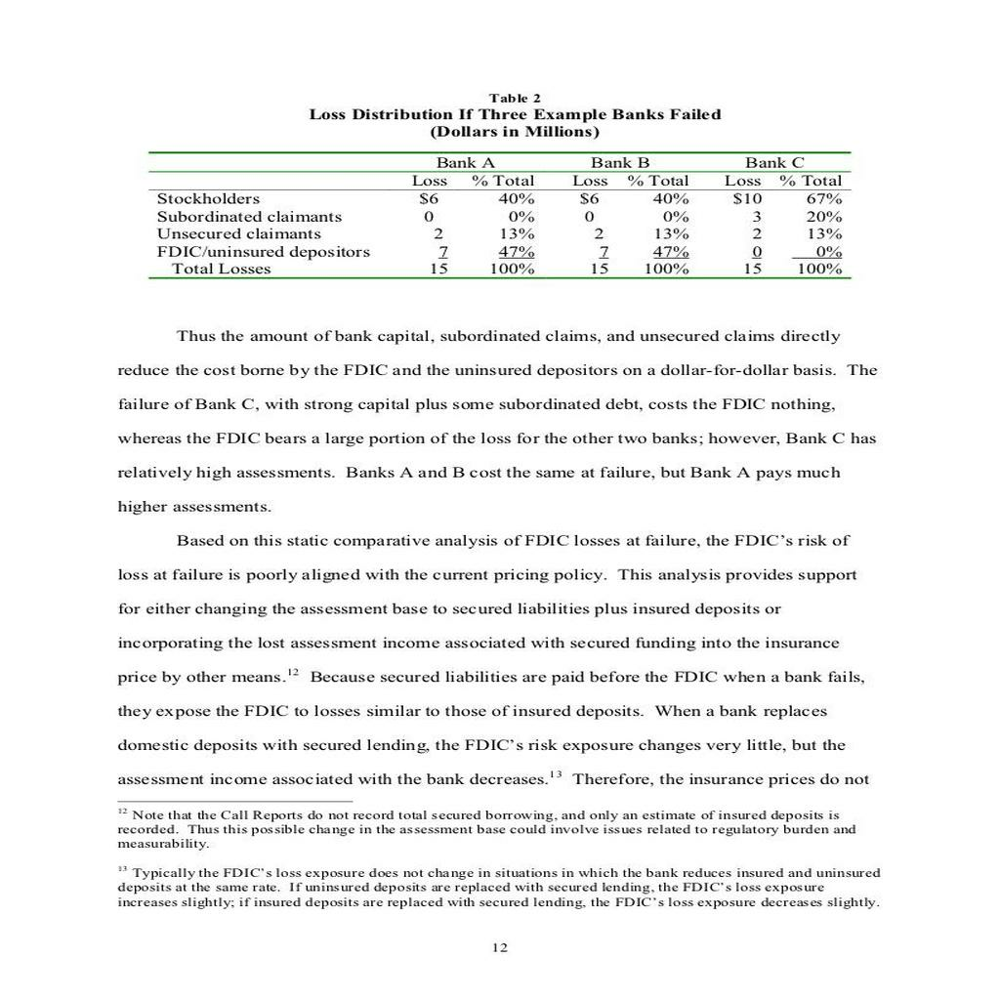

Table mask generated by the trained model

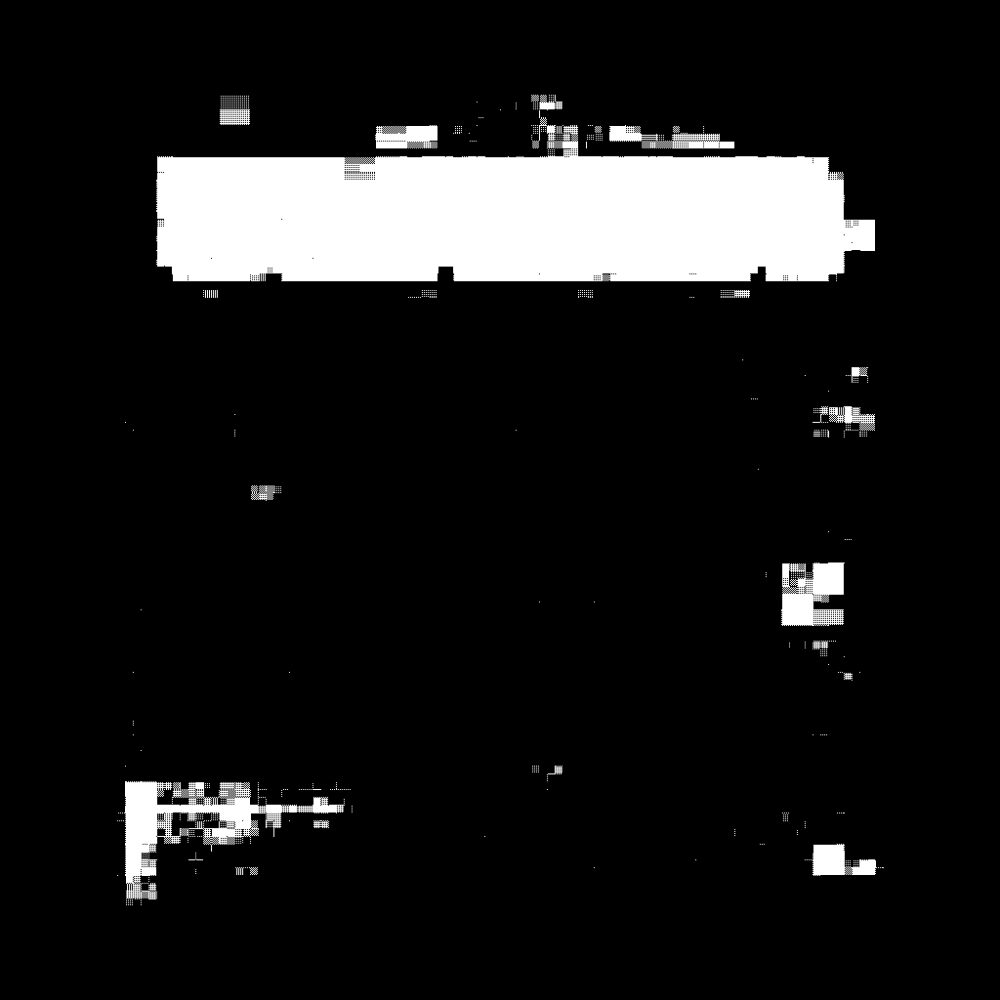

Column mask

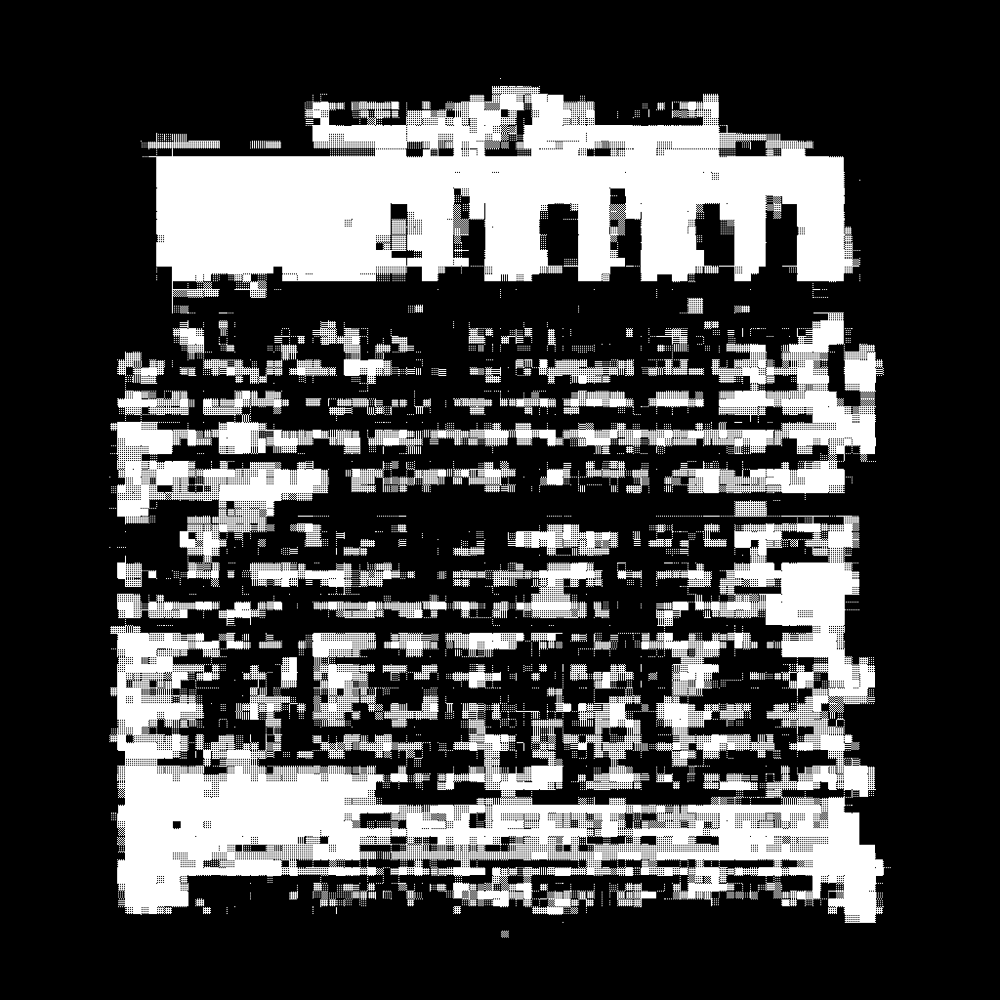

In [49]:
#ref: https://stackoverflow.com/questions/65523727/python-image-masking-and-removing-background?noredirect=1&lq=1

"""
based on the generated masks this function will crop the image from the original one which is only covered by the 
corresponding masks 
"""

from PIL import Image

# load images
img_org  = Image.open('./image.bmp')
img_mask = Image.open('./table_mask.bmp')

# convert images
#img_org  = img_org.convert('RGB') # or 'RGBA'
img_mask = img_mask.convert('L')    # grayscale


# add alpha channel    
img_org.putalpha(img_mask)

# save as png which keeps alpha channel 
img_org.save('output.png')

let's check the output image

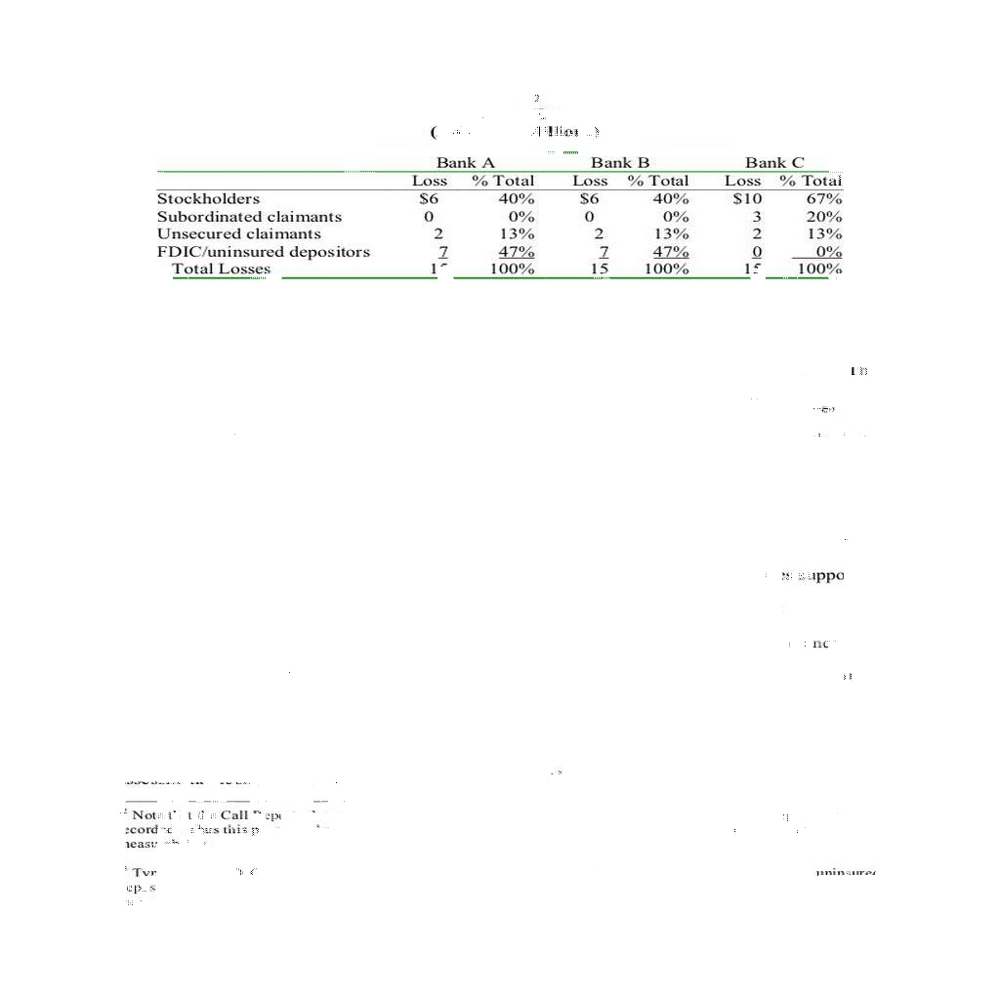

Next we will extract the information using pytesseract

In [50]:
from PIL import Image
import pytesseract

def ocr_core(filename):
    """
    This function will handle the core OCR processing of images.
    """
    text = pytesseract.image_to_string(Image.open(filename))  # We'll use Pillow's Image class to open the image and pytesseract to detect the string in the image
    return text

print(ocr_core('./output.png'))

 

a;

 

 

 

¢ Vier
Bank A ™ Bank B Bank C
Loss %Total Loss %Total Loss % Totai
Stockholders 36 40%  S6 40% $10 67%
Subordinated claimants 0 0% 0 0% 3 20%
Unsecured claimants 2 13% 2 13% 2 13%
FD1IC/uninsured depositors Zz 47% 2 4% 9 0%
Total Losses 17 100% 15 100% if 100%
In
“
+s Suppo
ne



In [ ]:
#Unused as the procedure is not so useful and failed to return satisfactore result 
"""
To store the data in a csv file
"""

import csv

def split_list(l, n):
    splitted = []
    for i in range(0, len(l), n):
        splitted.append(l[i:i + n])
    return splitted

input_file = './myfile.txt'
output_file = './final.csv'
delimiter = ';'

# read input file
with open(input_file, 'r') as f:
    data = f.readlines()

# remove trailing whitespace and newlines
data = list(map(lambda x: x.strip(), data))
# remove empty elements 
data = list(filter(None, data))
# split data to rows-sized lists
data = split_list(data, rows)
# shape data
data = list(map(list, zip(*data)))

# write to csv
with open(output_file, 'w', newline='\n') as f:
    wr = csv.writer(f, delimiter=delimiter)
    for i in range(len(data)):
        wr.writerow(data[i])

Let's Check few more examples by uploading images manually. We will check other cases

In [20]:
list_ds = tf.data.Dataset.list_files('./*.jpg')

In [20]:
def process(file_paths):
    img = normalize(decode_img(tf.io.read_file(file_paths)))
    return img

In [ ]:
DATASET_SIZE = len(list(list_ds))
test_size = DATASET_SIZE
test = list_ds.take(test_size)
BATCH_SIZE = 1
BUFFER_SIZE = 1000
test = test.map(process)
test_datasetss = test.batch(BATCH_SIZE)

In [ ]:
def show_prediction_sample_image(dataset=None, num=1):
    for image in dataset.take(num):
        pred_mask1, pred_mask2 = model.predict(image, verbose=1)
        table_mask, column_mask = create_mask(pred_mask1, pred_mask2)
        
        im=tf.keras.preprocessing.image.array_to_img(image[0])
        im.save('image.bmp')
        
        im=tf.keras.preprocessing.image.array_to_img(table_mask)
        im.save('table_mask.bmp')
        
        im=tf.keras.preprocessing.image.array_to_img(column_mask)
        im.save('column_mask.bmp')


In [22]:
show_prediction_sample_image(test_dataset)

1/1 [==============================] - 0s 145ms/step


## 8.1 Example-1

The original image is , without any text

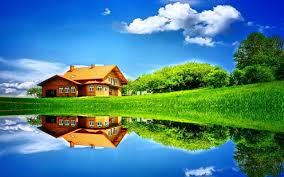

Now the generated table mask is 

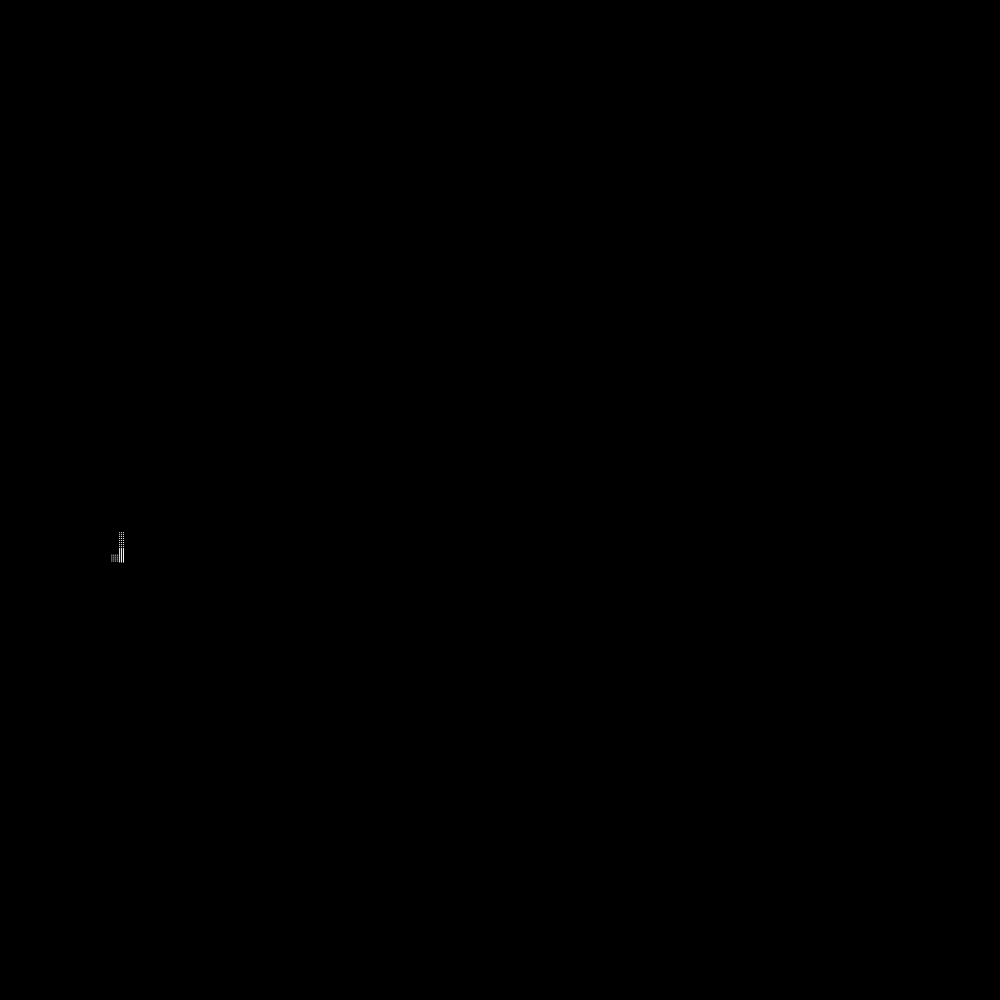

So the model can detect if there is no table present in the image (without any text)

## 8.2. Example-2

Now we will check another example where it doesn't contain any table but with text

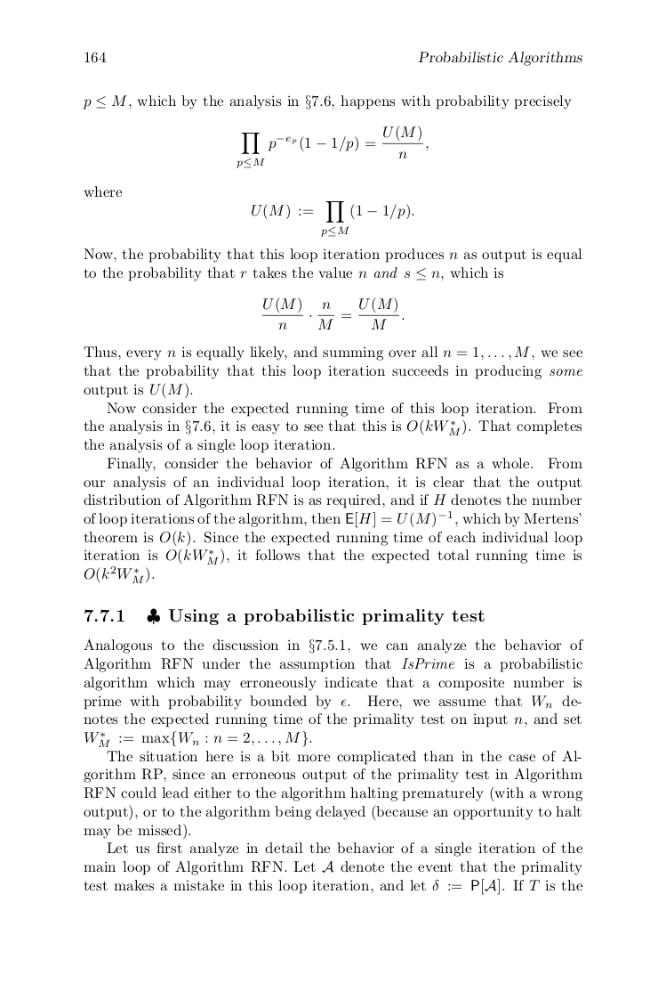

The corresponding generated Table-mask is

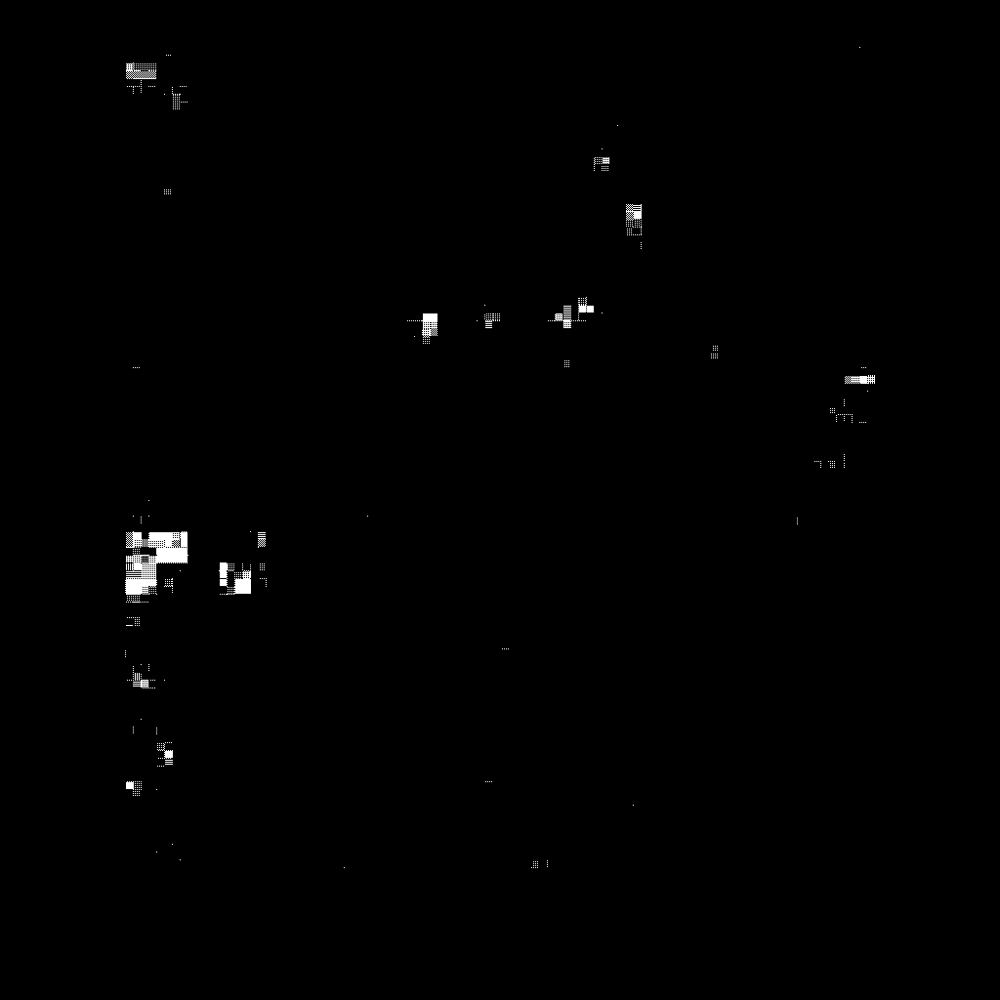

so we can conclude , since there is no table present in the image so Table-mask has been generated accordingly

## 8.3. Example-3

Let's check another example where the table is present

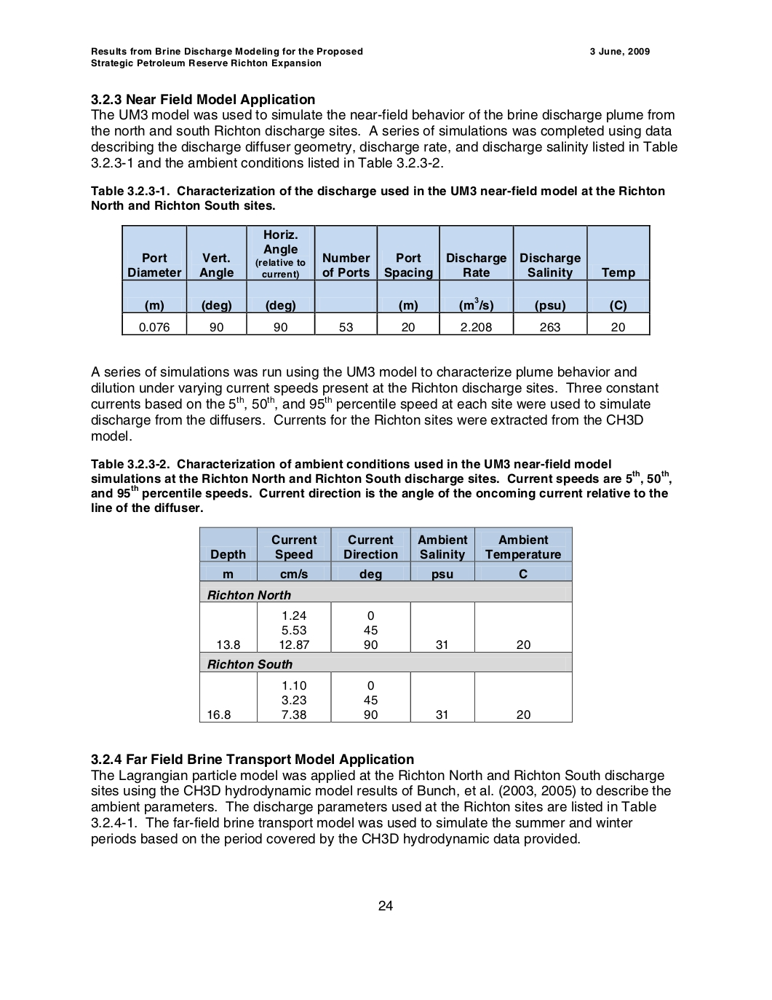

after applying the generated table_mask on the original image , we got

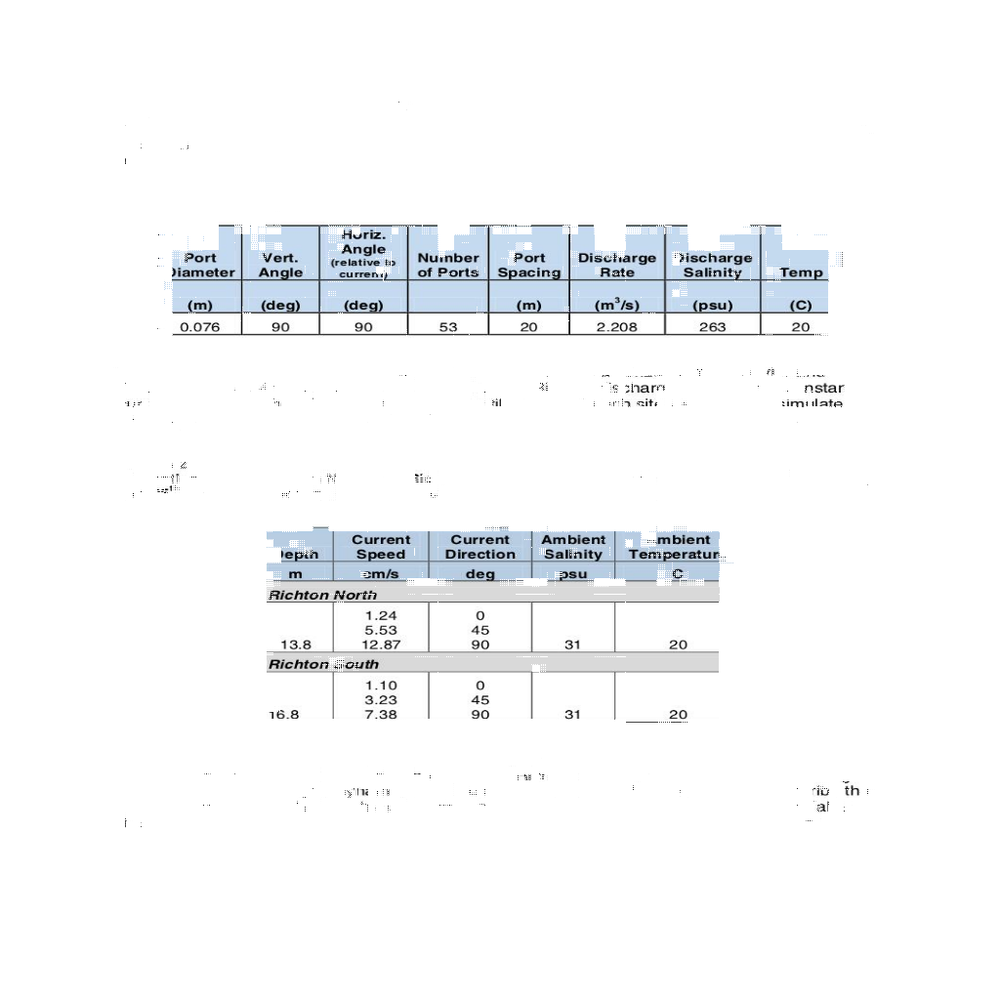

So the model was able to detect the table region

## 8.4. Example-4

Next we will consider one final example where the entire image is table region , without any extra text. 

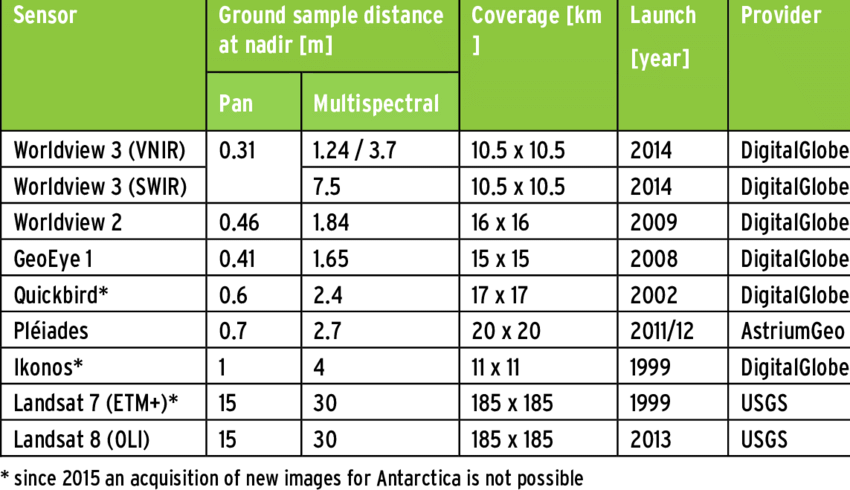


So in this image the model should detect the entire table

Unfortunately , our Model deliberately failed to detect the region properly

This is the final image after applying the generated Table-mask to the original image

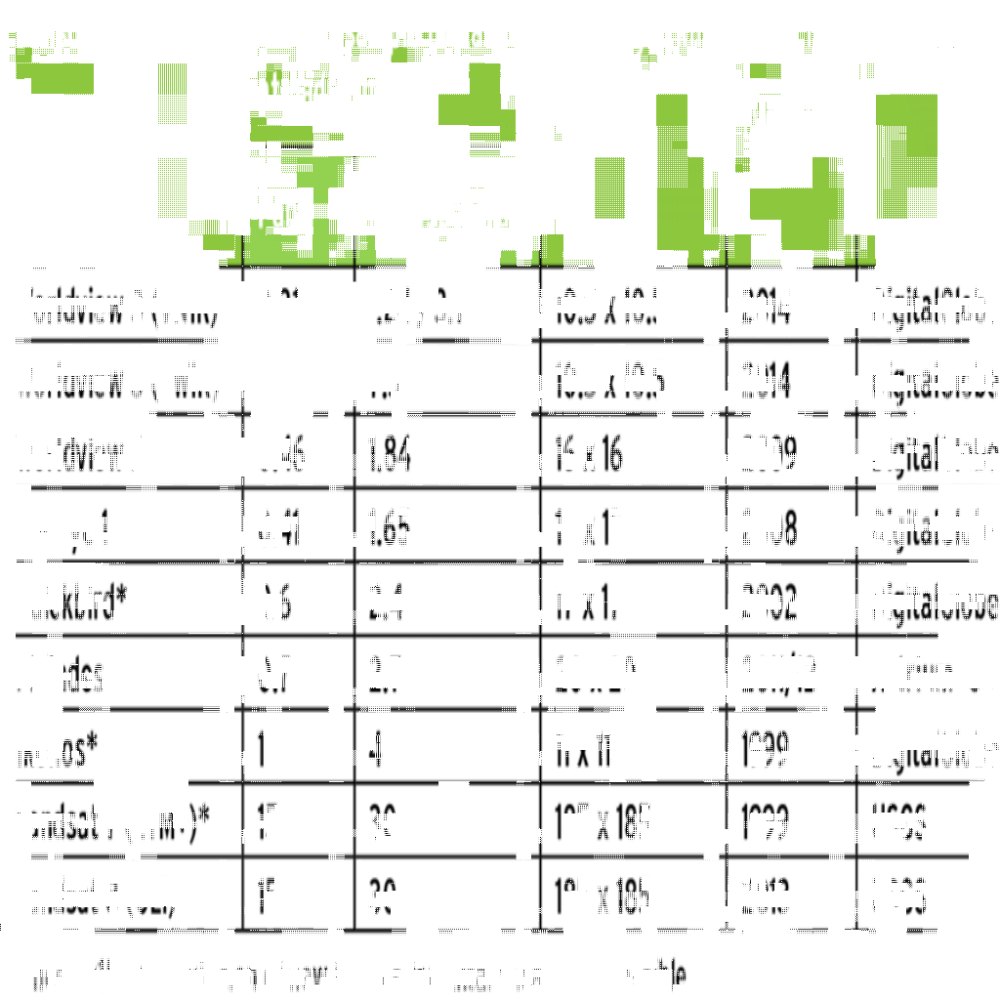

## 9. Precision & Recall

In [ ]:
"""
We are going to store the actual table and column mask in terms of tensor
"""
table=[]
column=[]
for i in test_dataset:
    table.append(i[1]['table_mask'])
    column.append(i[1]['column_mask'])

In [ ]:
"""
This will return the predicted Table and Column mask in terms of tensor
"""
def get_mask(dataset=None, num=1):
    tab=[]
    col=[]
    for image, (mask1, mask2) in dataset.take(num):
        pred_mask1, pred_mask2 = model.predict(image, verbose=1)
        table_mask, column_mask = create_mask(pred_mask1, pred_mask2)
        tab.append(table_mask)
        col.append(column_mask)
            
    return tab,col

In [28]:
tab_mask,col_mask=get_mask(test_dataset,len(test_dataset))

1/1 [==============================] - 0s 129ms/step


In [ ]:
"""
https://www.tensorflow.org/api_docs/python/tf/reshape

Need to reshape to match the shape of actual & predicted value
"""
mask_1=[]
mask_2=[]
for i in tab_mask:
    t2=tf.reshape(i, [1,1024, 1024])
    mask_1.append(t2)
    
for i in col_mask:
    t2=tf.reshape(i, [1,1024, 1024])
    mask_2.append(t2)

In [1]:
#https://www.tensorflow.org/api_docs/python/tf/keras/metrics/Recall
"""
Table mask Recall
"""

m = tf.keras.metrics.Recall()
m.update_state(table, mask_1)
m.result().numpy()

0.42771236

In [2]:
"""
Column mask Recall
"""
m = tf.keras.metrics.Recall()
m.update_state(column, mask_2)
m.result().numpy()

0.30130202

In [3]:
#https://www.tensorflow.org/api_docs/python/tf/keras/metrics/Precision
"""
Table mask Precision
"""
m = tf.keras.metrics.Precision()
m.update_state(table, mask_1)
m.result().numpy()

0.44971604

In [4]:
"""
Column mask Precision
"""
m = tf.keras.metrics.Precision()
m.update_state(column, mask_2)
m.result().numpy()

0.3701989

So For our model , Precision and Recall is significantly low 

## 10. Conclusion  

1. A single Model is sufficient to detect the table regions and extract the informations from there also we can get the result in <1Sec , so it's quiet fast

2. For extracting the information , it's completely dependent on the Tesseract OCR (pytesseract). even though the model can detect the table in low resolution image , However Tesseract will not work for low resolution image . So result will hamper if the original image is not in High resolution (at least 1024*1024). hence further improvement is needed

3. It's vey difficult to store the result in terms of a csv file in case tesseract doesn't return the text in proper format. Tried few method but no luck so far . So need to work on that in future for better performance.Till now we can store the extracted data only in a normal text file. 

4. As we checked in Example-4,  Model failed to detect the tabular region properly in case The entire image contains Table i.e. outside the table there is no other extra text. So it should be taken up as future improvements.

5. Unfortunately Precison and Recall is still very low, one reason could be due to less number of images for training set (only 400 images are present) and comparatively less number of Epoch due to limited GPU and free session . In future we can train the model again if we can collect more images and with higher number of epochs